# 5. Capstone Project: Exploratory Data Analysis

***

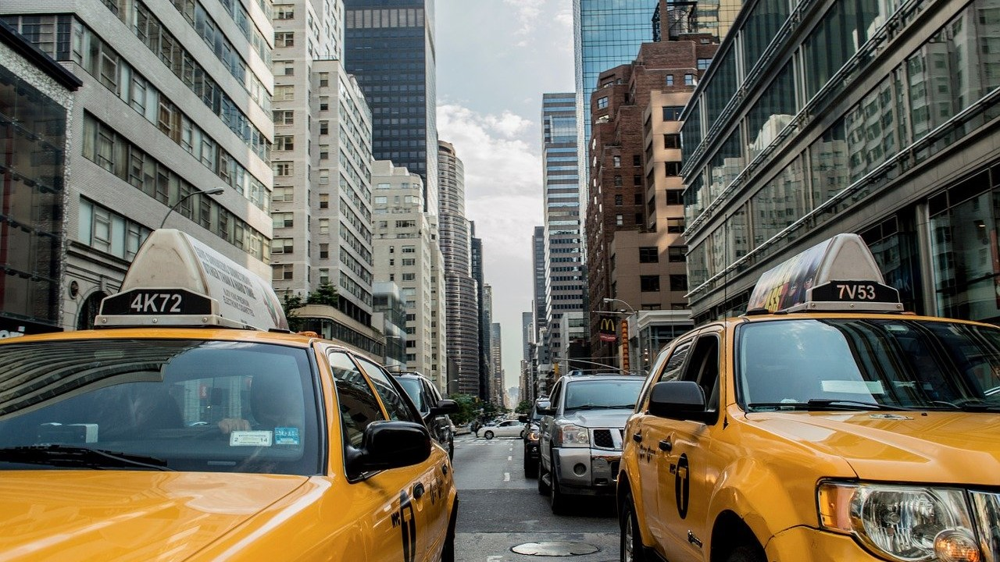

##  Goals

### Project:
Find out where and when traffic congestion is highest and lowest in New York City. Then build different machine learning models that can predict cab travel times in New York City, compare their performance, and explore the potential of additional features such as weather forecasts and holidays to improve the models' predictive performance.

### Section:


## Data
### External Datasets:
- Weather Forecast: The 2018 NYC weather forecast was collected from the [National Weather Service Forecast Office](https://w2.weather.gov/climate/index.php?wfo=okx) website. Daily measurements were taken from January to December 2018 in Central Park. These measures are given in imperial units and include daily minimum and maximum temperatures, precipitations, snowfall, and snow depth.

- Holidays: The 2018 NYC holidays list was collected from the [Office Holiday](https://www.officeholidays.com/countries/usa/new-york/2021) website. The dataset contains the name, date, and type of holidays for New York.

- Taxi Zones: The NYC Taxi Zones dataset was collected from the [NYC Open Data](https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc)website. It contains the pickup and drop-off zones (Location IDs) for the Yellow, Green, and FHV Trip Records. The taxi zones are based on the NYC Department of City Planning’s Neighborhood.

### Primary Datasets:

- Taxi Trips: The 2018 NYC Taxi Trip dataset was collected from the [Google Big Query](https://console.cloud.google.com/marketplace/product/city-of-new-york/nyc-tlc-trips?project=jovial-monument-300209&folder=&organizationId=) platform. The dataset contains more than 100'000'000 Yellow Taxi Trip records for 2018 and contains an extensive amount of variables including the pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts.

***
## Table of Content:

    1. Data Preparation
        1.1 External datasets
            1.1.1 Weather Forecast Dataset
            1.1.2 Holidays Dataset
            1.1.3 Taxi Zones Dataset
        1.2 Primary Dataset
            1.2.1 Taxi Trips Dataset
    2. Exploratory Data Analysis
    3. Machine Learning Models

    

***
## Python Libraries and Magic commands Import

In [1]:
# Import python core libraries
import itertools

# Import data processing libraries
import numpy as np
import pandas as pd

# Import Visualization librairies
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx

# Import machine learning libraries
from sklearn.model_selection import train_test_split

In [2]:
# Set up magic commands
%matplotlib inline
%config Completer.use_jedi = False

***
## Data Import

In [3]:
# Import the train dataset
train_df = pd.read_pickle(r'data/processed/train_df.pickle')

# Import the test dataset
test_df = pd.read_pickle(r'data/processed/test_df.pickle')

# Import the zones dataset
zones_df = pd.read_pickle(r'data/processed/zones.pickle')

***
## Functions import

In [4]:
# Define a function that transform column headers to titles
def to_title(data, sep="_"):
    return [s.replace(sep, " ").title() for s in data]

In [5]:
# Define a function that display a heatmap
def plot_heatmap(data, xticks, yticks, xlabel, ylabel, figsize=(20, 5)):
    # Create a figure with one column and row
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)

    # Generate the plot
    ax.imshow(data, origin="lower", aspect="auto", cmap="viridis")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.set_xlim(1)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [6]:
# Define a function that display individual barplot
def plot_lineplot(
    data, x_var, y_var, labels, xlabel, ylabel, figsize=(20, 5), palette="Set2"
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)

    # Generate the plot
    ax = sns.lineplot(x=x_var, y=y_var, hue=labels, data=data, palette=palette)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [7]:
# Define a function that display individual barplot
def plot_barplot(
    data, x_var, y_var, labels, xlabel, ylabel, figsize=(20, 5), palette="Set2"
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)

    # Generate the plot
    ax = sns.barplot(x=x_var, y=y_var, hue=labels, data=data, palette=palette)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [8]:
def plot_clockhist(
    data,
    columns,
    colnames,
    title,
    ylim,
    yticks,
    yticklabels,
    nrows=1,
    ncols=1,
    palette="Set2",
):

    # Get the color palette
    cpal = itertools.cycle(sns.color_palette(palette))

    # Create a figure with n columns and rows
    fig, axes = plt.subplots(
        ncols=ncols,
        nrows=nrows,
        figsize=(5 * ncols, 5 * nrows),
        subplot_kw=dict(projection="polar"),
    )

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Define theta for 24 hours
    theta = np.linspace(0, 2 * np.pi, 24, endpoint=False)

    # Define the width of each bin
    width = np.divide(np.multiply(2, np.pi), 24)

    # Generate the plots
    for ax, col, colname, color in zip(axes, columns, colnames, cpal):
        ax.bar(
            theta,
            data[col],
            width=width,
            align="edge",
            linewidth=0.25,
            color=color,
            edgecolor="dimgrey",
        )
        ax.set_theta_direction(-1)
        ax.set_theta_zero_location("N")
        ax.set_ylim(0, ylim)
        ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))
        ax.set_yticks(yticks)
        ax.set_xticklabels(
            [f"{x}:00" for x in np.arange(0, 24, 3)], rotation="vertical"
        )
        ax.set_yticklabels(yticklabels, rotation="vertical")
        ax.set_title(colname)
        ax.set_axis_on()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Adding a title to the plot
    plt.suptitle(title, y=1.10, fontsize=16)

    # Display the plot
    plt.show()

In [9]:
def plot_map(data, columns, colnames, nrows=1, ncols=1, legend=True, figsize=(20, 5)):
    # Creat a figure with n rows and one columns
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        constrained_layout=True,
        sharex=True,
        sharey=True,
        subplot_kw=dict(aspect="equal"),
    )

    # Get the min from selected columns in the data frame
    vmin = np.min([data[c].min() for c in columns])

    # Get the max from selected columns in the data frame
    vmax = np.max([data[c].max() for c in columns])

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Generate the plots
    for ax, col, colname in zip(axes, columns, colnames):
        plot = data.plot(
            column=col,
            ax=ax,
            alpha=0.33,
            cmap="viridis",
            edgecolor="k",
            linewidth=0.33,
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(colname, fontsize=18)

        # Add a base map of New York City
        ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

    # assume it's the first (and only) mappable
    cb = fig.colorbar(
        axes[0].collections[0],
        ax=axes,
        shrink=0.5,
        orientation="horizontal",
    )

    # Display the plot
    plt.show()

***

## 2. Exploratory Data Analysis
### Goal:
Explore a subset (10%) of the 2018 NYC yellow taxi trip dataset dataset and perform 
### Code:

In [10]:
train_df.columns

Index(['trip_distance', 'pickup_location_id', 'dropoff_location_id',
       'trip_duration', 'pickup_month', 'pickup_week', 'pickup_yearday',
       'pickup_weekday', 'pickup_weekday_type', 'pickup_hour',
       'pickup_hour_type', 'avg_temp', 'prec', 'new_snow', 'snow_depth',
       'holiday_type', 'holiday', 'pickup_borough_id', 'dropoff_borough_id',
       'trip_within_borough', 'toll'],
      dtype='object')

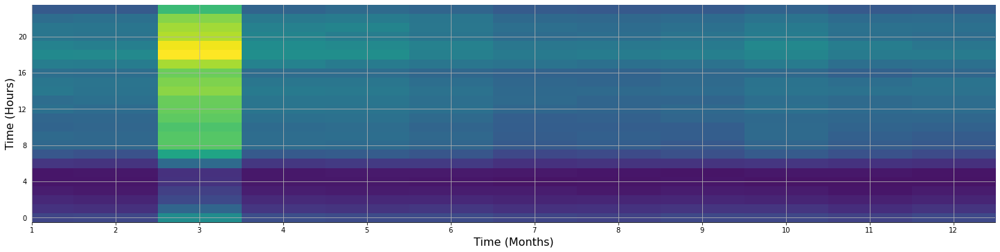

In [11]:
# Aggregate taxi rides by month
monthly_rides = (
    train_df.groupby(["pickup_month", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the monthly taxi rides data frame
monthly_rides_pvt = monthly_rides.pivot(
    index="pickup_hour", columns="pickup_month", values="count"
).reset_index()

# Display the heatmap
plot_heatmap(
    monthly_rides_pvt,
    xticks=np.arange(1, 13, 1),
    yticks=np.arange(0, 24, 4),
    xlabel="Time (Months)",
    ylabel="Time (Hours)",
)

**Observations:** less ride for 7 8 9 and 11 12

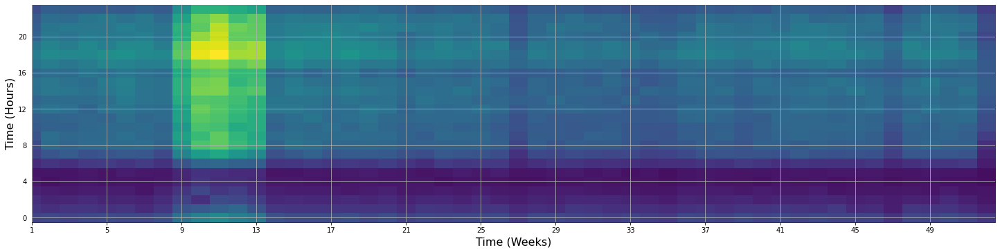

In [12]:
# Aggregate taxi rides by week
weekly_rides = (
    train_df.groupby(["pickup_week", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the weekly taxi rides data frame
weekly_rides_pvt = weekly_rides.pivot(
    index="pickup_hour", columns="pickup_week", values="count"
).reset_index()

# Display the heatmap
plot_heatmap(
    weekly_rides_pvt,
    xticks=np.arange(1, 53, 4),
    yticks=np.arange(0, 24, 4),
    xlabel="Time (Weeks)",
    ylabel="Time (Hours)",
)

**Observations:**

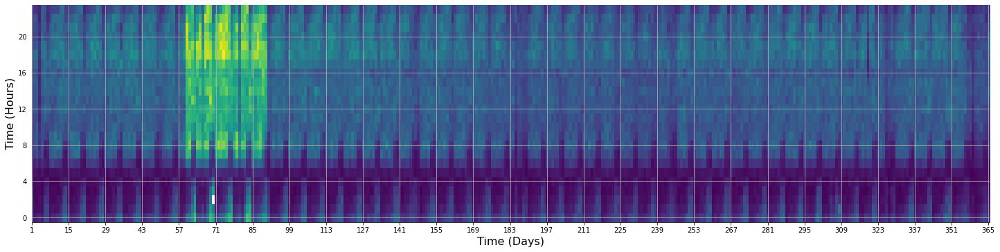

In [13]:
# Aggregate taxi rides by day
daily_rides = (
    train_df.groupby(["pickup_yearday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the daily taxi rides data frame
daily_rides_pvt = daily_rides.pivot(
    index="pickup_hour", columns="pickup_yearday", values="count"
).reset_index()

# Display the heatmap
plot_heatmap(
    daily_rides_pvt,
    xticks=np.arange(1, 366, 14),
    yticks=np.arange(0, 24, 4),
    xlabel="Time (Days)",
    ylabel="Time (Hours)",
)

**Observations:**

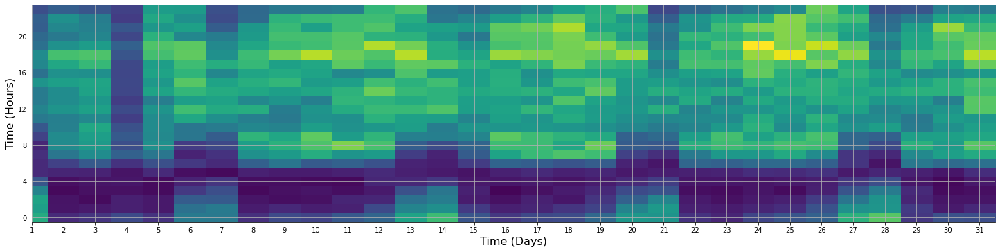

In [14]:
# Display the heatmap for the first 31 days of the year
plot_heatmap(
    daily_rides_pvt.iloc[:, 0:32],
    xticks=np.arange(1, 32, 1),
    yticks=np.arange(0, 24, 4),
    xlabel="Time (Days)",
    ylabel="Time (Hours)",
)

**Observations:** Day 4 less rides, weekends

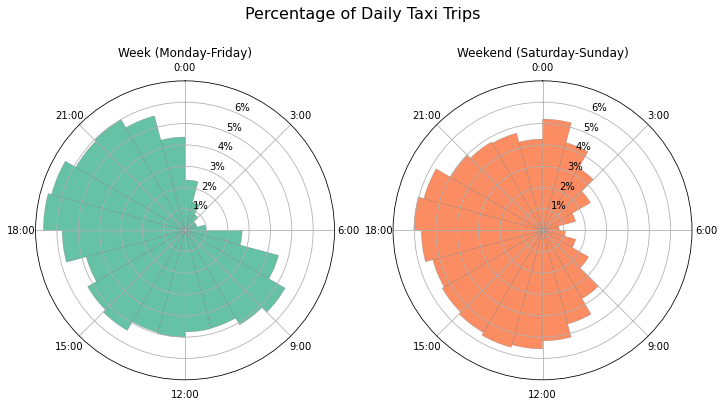

In [15]:
#
hourly_rides = (
    train_df.groupby(["pickup_weekday_type", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

#
hourly_rides_week = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 0, ["pickup_hour", "count"]
]

#
hourly_rides_weekend = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 1, ["pickup_hour", "count"]
]

#
hourly_rides_week["percent"] = (
    np.divide(hourly_rides_week["count"], hourly_rides_week["count"].sum()) * 100
)

#
hourly_rides_weekend["percent"] = (
    np.divide(hourly_rides_weekend["count"], hourly_rides_weekend["count"].sum()) * 100
)

#
hourly_ride_weektype_df = pd.DataFrame(
    {
        "hourly_rides_week": hourly_rides_week["percent"].to_list(),
        "hourly_rides_weekend": hourly_rides_weekend["percent"].to_list(),
    }
)

# Display scatterplot of numerical columns
plot_clockhist(
    hourly_ride_weektype_df,
    columns=["hourly_rides_week", "hourly_rides_weekend"],
    colnames=[
        "Week (Monday-Friday)",
        "Weekend (Saturday-Sunday)",
    ],
    title="Percentage of Daily Taxi Trips",
    ylim=7.0,
    yticks=np.arange(1, 7, 1),
    yticklabels=[f"{y}%" for y in np.arange(1, 7, 1)],
    ncols=2,
)

In [16]:
# Define a lit of week days
weekdays = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

In [17]:
#
hourly_pickup_count = (
    train_df.groupby(["pickup_weekday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Map numerical values to week days
hourly_pickup_count["pickup_weekday"] = hourly_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

#
hourly_pickup_count_pvt = hourly_pickup_count.pivot(
    index="pickup_hour", columns="pickup_weekday", values="count"
)

# Display the first five rows of the data frame
hourly_pickup_count_pvt.head()

pickup_weekday,friday,monday,saturday,sunday,thursday,tuesday,wednesday
pickup_hour,,,,,,,
0,4189,1967,5927,5768,3185,2108,2707
1,2653,1228,4690,4852,1734,1111,1477
2,1667,828,3684,3865,1097,683,881
3,1032,664,2794,3019,701,447,615
4,921,666,1656,1928,707,537,660


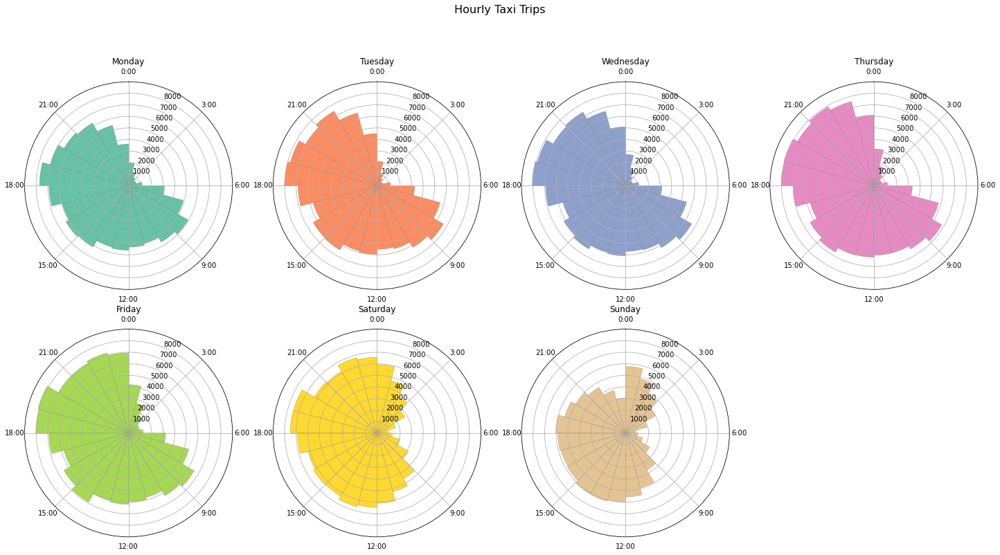

In [18]:
#
plot_clockhist(
    hourly_pickup_count_pvt,
    columns=[w.lower() for w in weekdays],
    colnames=weekdays,
    title="Hourly Taxi Trips",
    ylim=9000,
    yticks=np.arange(1000, 9000, 1000),
    yticklabels=[f"{y}" for y in np.arange(1000, 9000, 1000)],
    ncols=4,
    nrows=2,
)

**Observations:** same pattern between week and weekend but less rides on sunday

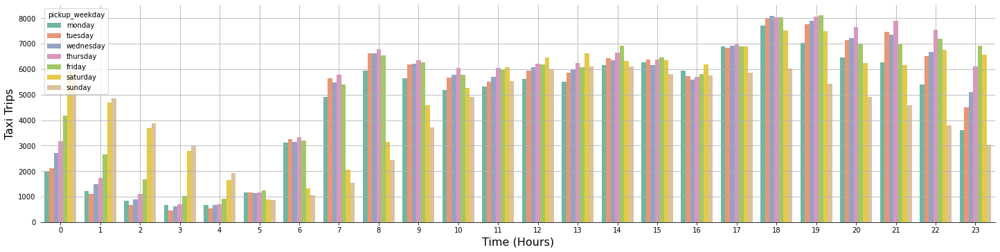

In [19]:
# Display a
plot_barplot(
    hourly_pickup_count,
    x_var="pickup_hour",
    y_var="count",
    labels="pickup_weekday",
    xlabel="Time (Hours)",
    ylabel="Taxi Trips",
)

**Observations:** More taxi ride doesnt mean longer trip duration

In [20]:
# Group taxi rides by week days and hours
# Compute the mean of trip distrances and durations
hourly_pickup_avg = (
    train_df.groupby(["pickup_weekday", "pickup_hour"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg["trip_speed"] = np.divide(
    hourly_pickup_avg["trip_distance"], np.divide(hourly_pickup_avg["trip_duration"], 60)
)

# Map numerical values to week days
hourly_pickup_avg["pickup_weekday"] = hourly_pickup_avg["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Display the first five rows of the data frame
hourly_pickup_avg.head()

,pickup_weekday,pickup_hour,trip_distance,trip_duration,trip_speed
0,monday,0,6.153120,11.716175,31.510896
1,monday,1,5.725188,11.333103,30.310434
2,monday,2,5.417412,10.983837,29.593002
3,monday,3,5.553459,11.072641,30.092871
4,monday,4,6.767154,11.342893,35.795915


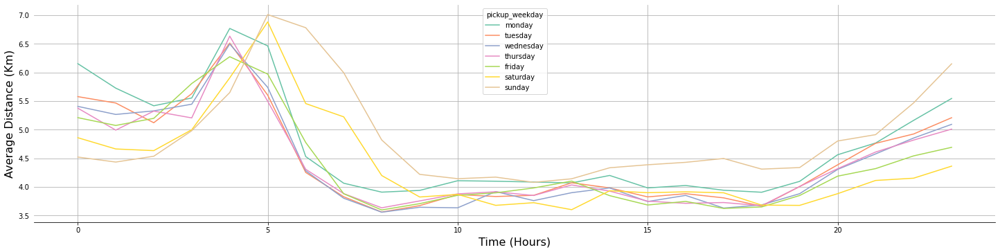

In [21]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="pickup_weekday",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)"
)

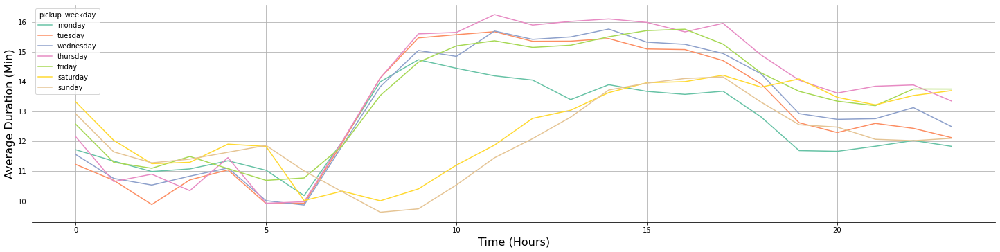

In [22]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="pickup_weekday",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)"
)

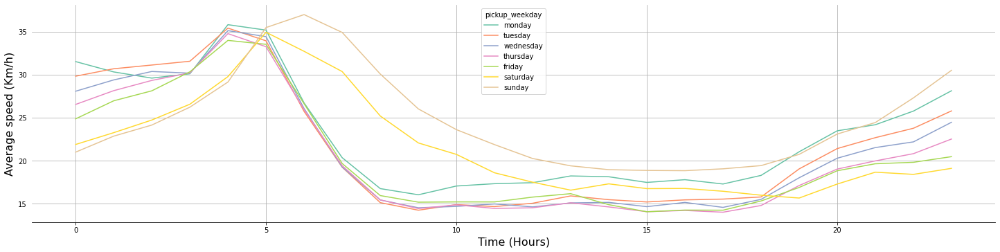

In [23]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="pickup_weekday",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)"
)

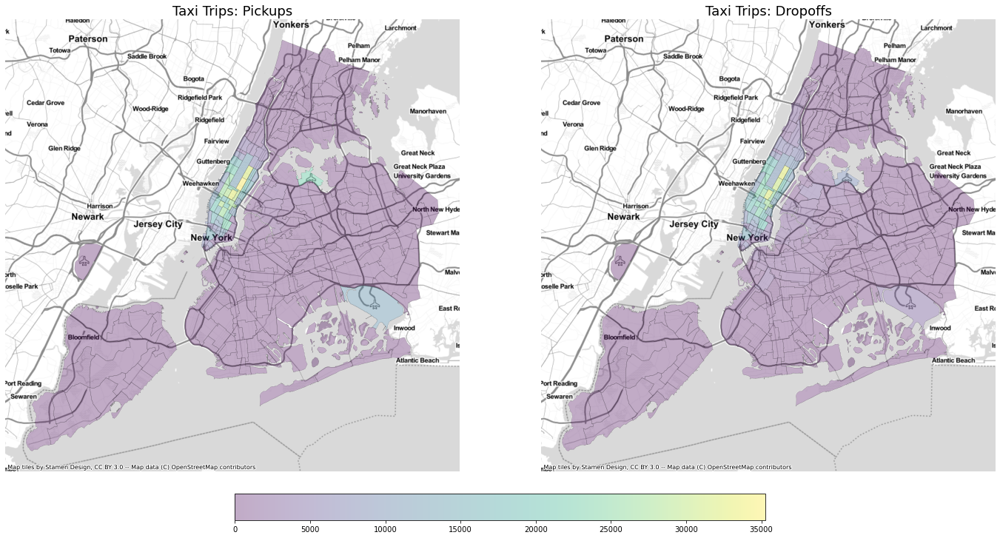

In [24]:
#
total_pickup_count = (
    train_df.groupby(["pickup_location_id"]).size().to_frame("pickup_all").reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count = (
    train_df.groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(zones_df, total_pickup_count, how="left", on="LocationID")

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all", "dropoff_all"],
    ["Taxi Trips: Pickups", "Taxi Trips: Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

In [25]:
train_df.columns

Index(['trip_distance', 'pickup_location_id', 'dropoff_location_id',
       'trip_duration', 'pickup_month', 'pickup_week', 'pickup_yearday',
       'pickup_weekday', 'pickup_weekday_type', 'pickup_hour',
       'pickup_hour_type', 'avg_temp', 'prec', 'new_snow', 'snow_depth',
       'holiday_type', 'holiday', 'pickup_borough_id', 'dropoff_borough_id',
       'trip_within_borough', 'toll'],
      dtype='object')

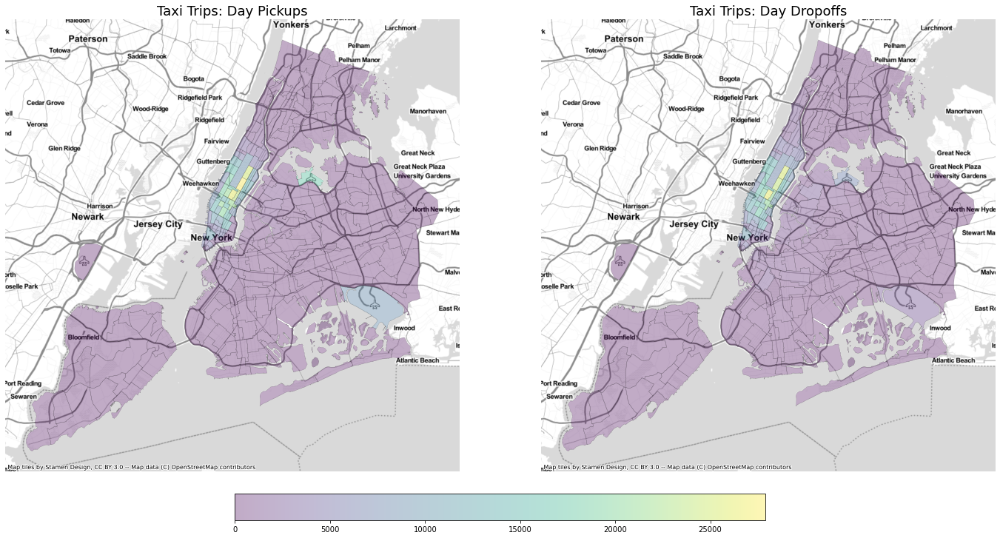

In [26]:
#
total_pickup_count_day = (
    train_df[train_df.pickup_weekday_type == 0]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_day")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count_day = (
    train_df[train_df.pickup_weekday_type == 0]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_day")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(
    zones_df, total_pickup_count_day, how="left", on="LocationID"
)

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_day, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all_day", "dropoff_all_day"],
    ["Taxi Trips: Day Pickups", "Taxi Trips: Day Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

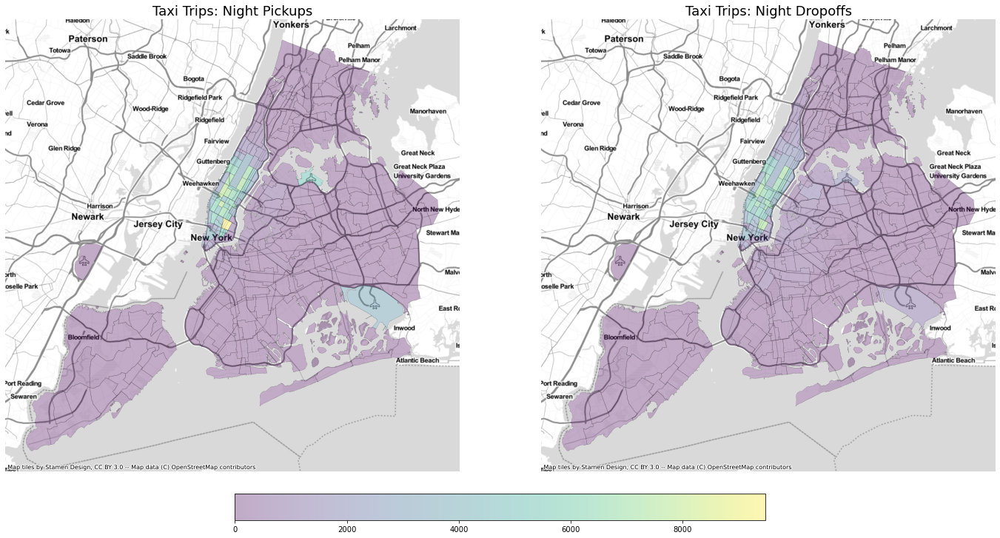

In [27]:
#
total_pickup_count_night = (
    train_df[train_df.pickup_weekday_type == 1]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_night")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count_night = (
    train_df[train_df.pickup_weekday_type == 1]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_night")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(
    zones_df, total_pickup_count_night, how="left", on="LocationID"
)

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_night, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all_night", "dropoff_all_night"],
    ["Taxi Trips: Night Pickups", "Taxi Trips: Night Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Observations:**

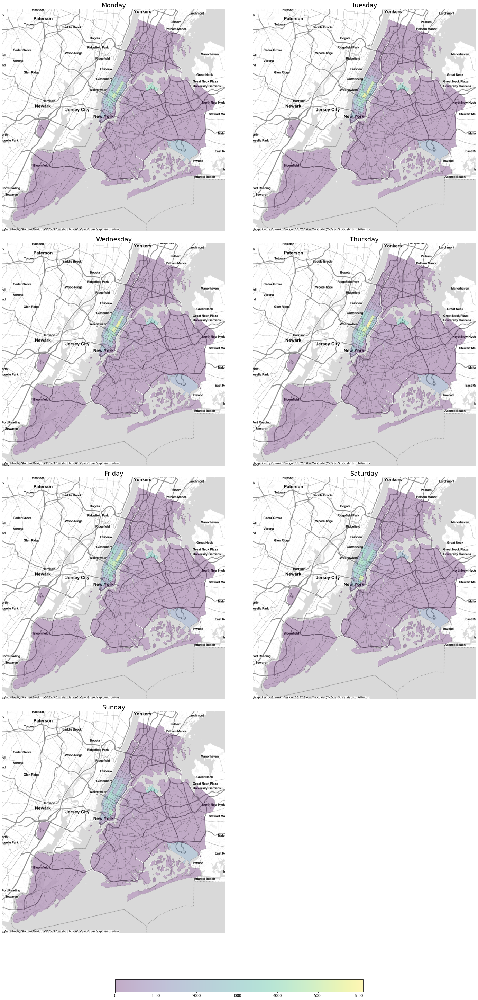

In [28]:
#
daily_pickup_count = (
    train_df.groupby(["pickup_location_id", "pickup_weekday"])
    .size()
    .to_frame("count")
    .reset_index()
)

#
daily_pickup_columns = ["pickup_" + w.lower() for w in weekdays]

#
daily_pickup_count["pickup_weekday"] = daily_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), daily_pickup_columns))
)

# Pivot the daily pickup data frame on the pickup weekday column
daily_pickup_count = daily_pickup_count.pivot(
    index="pickup_location_id", columns="pickup_weekday", values="count"
).reset_index()

# Rename the id column of the daily pickups data frame
daily_pickup_count = daily_pickup_count.rename(
    columns={"pickup_location_id": "LocationID"}
)

# Merge the daily pickups data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df, daily_pickup_count, how="left", on="LocationID"
)

# Fill NA values in the dataframe with zeros
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    daily_pickup_columns,
    weekdays,
    nrows=4,
    ncols=2,
    legend=None,
    figsize=(20, 40),
)

**Observations:**

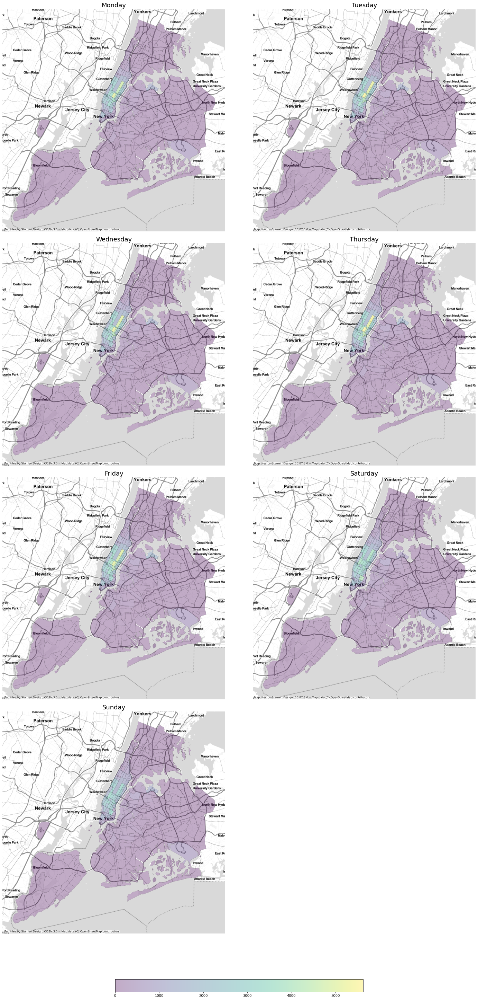

In [29]:
#
daily_dropoff_count = train_df.groupby(["dropoff_location_id", "pickup_weekday"]).size().to_frame("count").reset_index()


#
daily_dropoff_columns = ["dropoff_" + w.lower() for w in weekdays]

#
daily_dropoff_count["pickup_weekday"] = daily_dropoff_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), daily_dropoff_columns))
)

# Pivot the daily pickup data frame on the pickup weekday column
daily_dropoff_count = daily_dropoff_count.pivot(
    index="dropoff_location_id", columns="pickup_weekday", values="count"
).reset_index()

# Rename the id column of the daily pickups data frame
daily_dropoff_count = daily_dropoff_count.rename(
    columns={"dropoff_location_id": "LocationID"}
)

# Merge the daily pickups data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df.copy(), daily_dropoff_count, how="left", on="LocationID"
)

# Fill NA values in the dataframe with zeros
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    daily_dropoff_columns,
    weekdays,
    nrows=4,
    ncols=2,
    legend=None,
    figsize=(20, 40),
)

**Observations:**

In [49]:
# Group taxi rides by toll amount
# Compute the mean of trip distrances and durations
hourly_pickup_avg_toll = (
    train_df.groupby(["toll"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Display the first five rows of the data frame
hourly_pickup_avg_toll.head()



,toll,trip_distance,trip_duration
0,0,3.596250,12.670007
1,1,16.641175,26.404641
2,2,18.298666,33.180997


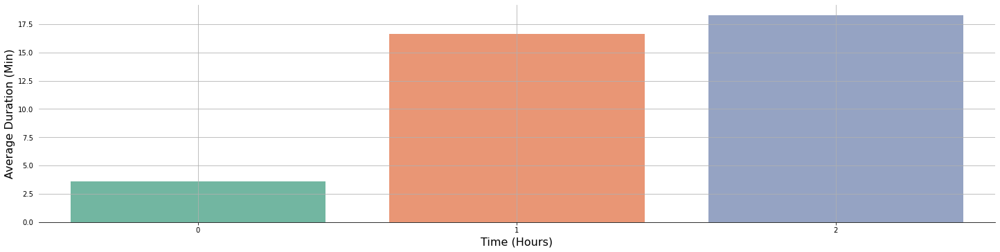

In [50]:
# Display a
plot_barplot(
    hourly_pickup_avg_toll,
    x_var="toll",
    y_var="trip_distance",
    labels=None,
    xlabel="Toll Category",
    ylabel="Average Distrnace (Km)"
)

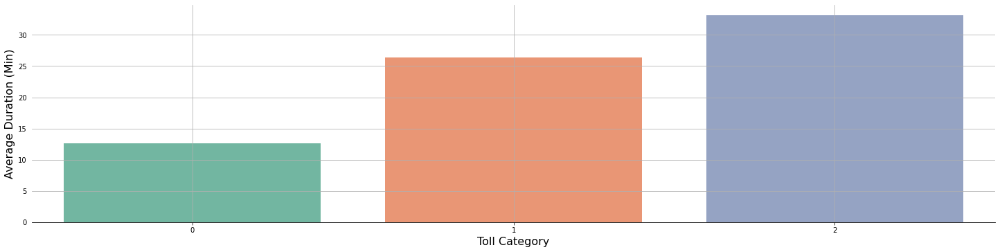

In [52]:
# Display a
plot_barplot(
    hourly_pickup_avg_toll,
    x_var="toll",
    y_var="trip_duration",
    labels=None,
    xlabel="Toll Category",
    ylabel="Average Duration (Min)"
)

## External dataset Exploration

In [31]:
# Group taxi trips by year day, hour and average temperature and compute the count
hourly_pickup_count_temp = (
    train_df.groupby(["pickup_yearday", "pickup_hour", "avg_temp"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zeros with NaN to avoid impacting the mean
hourly_pickup_count_temp["count"].replace(0, np.nan, inplace=True)

# Group taxi trips by hour and compute the mean
hourly_pickup_count_temp = (
    hourly_pickup_count_temp.groupby(["pickup_hour", "avg_temp"])
    .agg({"count": np.mean})
    .reset_index()
)

# Map numerical values to average temperature groups
hourly_pickup_count_temp["avg_temp"] = hourly_pickup_count_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_count_temp.head()

,pickup_hour,avg_temp,count
0,0,Very Low,59.187500
1,0,Low,79.257812
2,0,Medium,73.870968
3,0,High,61.632812
4,1,Very Low,41.625000


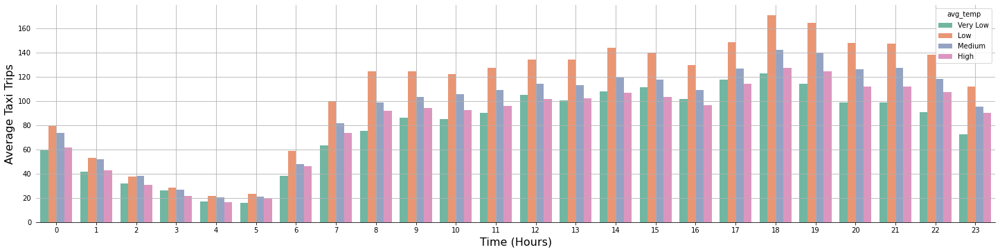

In [32]:
plot_barplot(    hourly_pickup_count_temp,
    x_var="pickup_hour",
    y_var="count",
    labels="avg_temp",
    xlabel="Time (Hours)",
    ylabel="Average Taxi Trips")

In [33]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_avg_temp= (
    train_df.groupby(["pickup_hour", "avg_temp"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
).replace(0, np.nan)

# Compute the average trip speed
hourly_pickup_avg_temp["trip_speed"] = np.divide(
    hourly_pickup_avg_temp["trip_distance"], np.divide(hourly_pickup_avg_temp["trip_duration"], 60)
)

# Map numerical values to average temperature groups
hourly_pickup_avg_temp["avg_temp"] = hourly_pickup_avg_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_avg_temp.head()

,pickup_hour,avg_temp,trip_distance,trip_duration,trip_speed
0,NaN,NaN,4.974781,11.925977,25.028294
1,NaN,Low,5.068806,12.375513,24.575007
2,NaN,Medium,5.022591,12.694457,23.739138
3,NaN,High,5.285577,12.529727,25.310578
4,1.0,NaN,4.927190,12.184560,24.262790


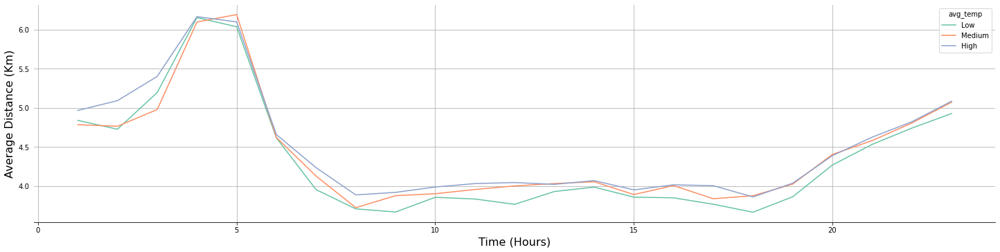

In [34]:
# Display a
plot_lineplot(
    hourly_pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="avg_temp",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)"
)

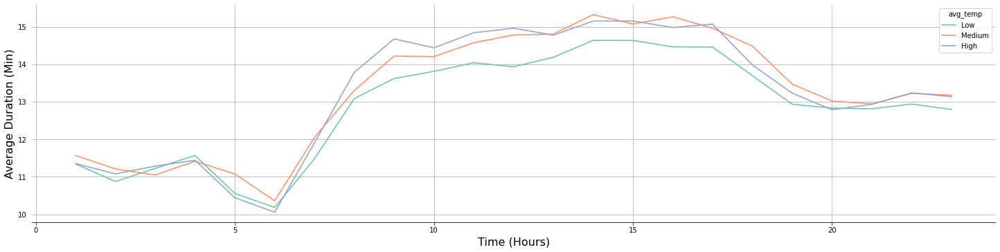

In [35]:
# Display a
plot_lineplot(
    hourly_pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="avg_temp",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)"
)

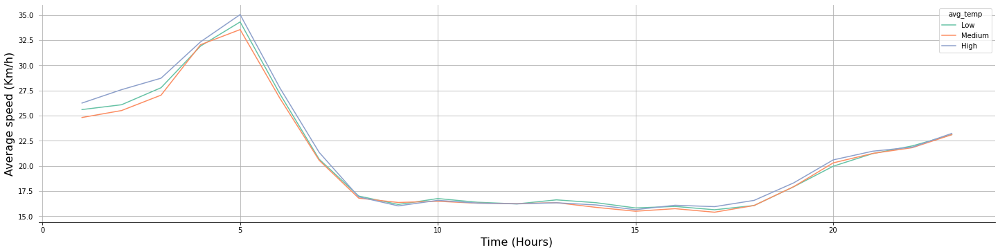

In [36]:
# Display a
plot_lineplot(
    hourly_pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="avg_temp",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)"
)

In [37]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_count_prec = (
    train_df.groupby(["pickup_hour", "prec", "pickup_yearday"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zeros with NaN to avoid impacting the mean
hourly_pickup_count_prec["count"].replace(0, np.nan, inplace=True)

#
hourly_pickup_count_prec = (
    hourly_pickup_count_prec.groupby(["pickup_hour", "prec"])
    .agg({"count":np.mean})
    .reset_index()
)


# Map numerical values to average temperature groups
hourly_pickup_count_prec["prec"] = hourly_pickup_count_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_count_prec.head()

,pickup_hour,prec,count
0,0,Very Low,70.904192
1,0,Low,70.520000
2,0,Medium,86.000000
3,0,High,49.333333
4,1,Very Low,48.973054


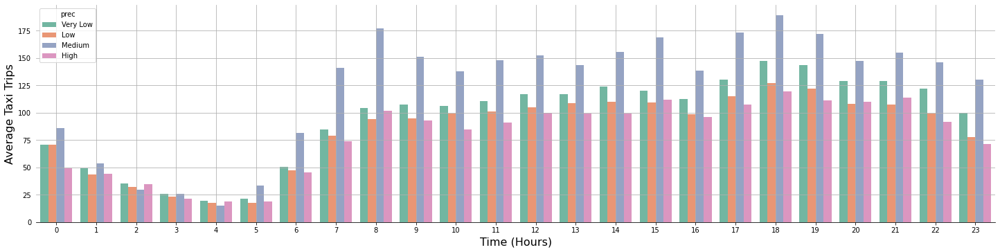

In [38]:
plot_barplot(
    hourly_pickup_count_prec,
    x_var="pickup_hour",
    y_var="count",
    labels="prec",
    xlabel="Time (Hours)",
    ylabel="Average Taxi Trips",
)

In [39]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_avg_prec= (
    train_df.groupby(["pickup_hour", "prec"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg_prec["trip_speed"] = np.divide(
    hourly_pickup_avg_prec["trip_distance"], np.divide(hourly_pickup_avg_prec["trip_duration"], 60)
)

# Map numerical values to average temperature groups
hourly_pickup_avg_prec["prec"] = hourly_pickup_avg_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_avg_prec.head()

,pickup_hour,prec,trip_distance,trip_duration,trip_speed
0,0,Very Low,5.118161,12.483464,24.599717
1,0,Low,5.076915,12.596464,24.182574
2,0,Medium,5.127619,11.790181,26.094354
3,0,High,5.780032,13.639189,25.426870
4,1,Very Low,4.878997,11.459681,25.545198


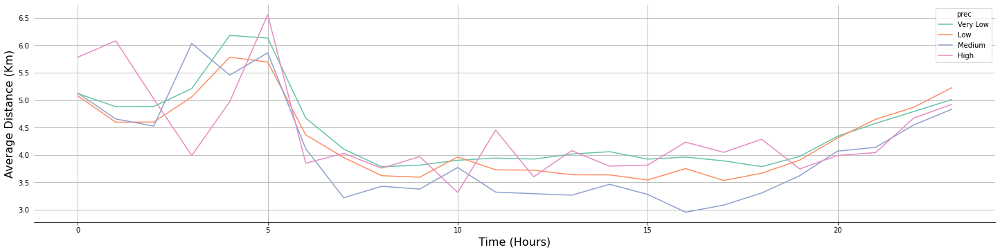

In [40]:
# Display a
plot_lineplot(
    hourly_pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="prec",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)"
)

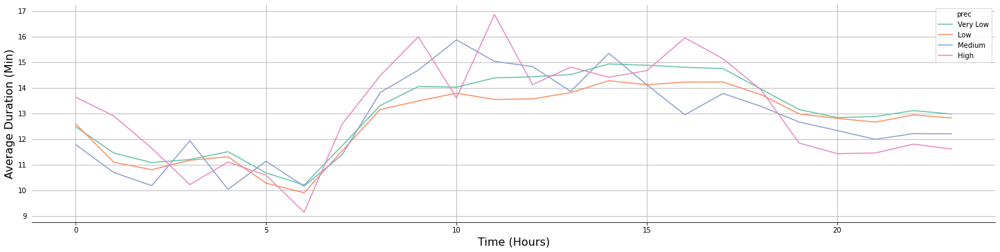

In [41]:
# Display a
plot_lineplot(
    hourly_pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="prec",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)"
)

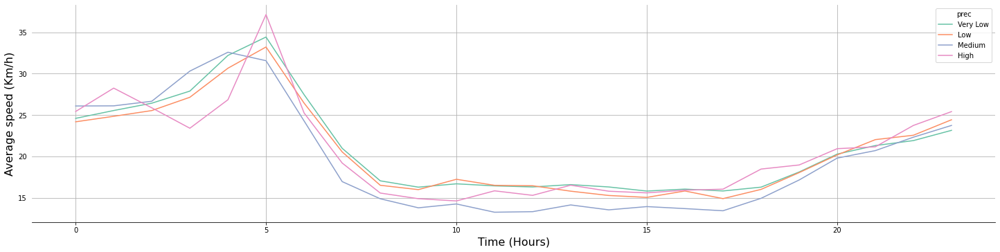

In [42]:
# Display a
plot_lineplot(
    hourly_pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="prec",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)"
)

In [43]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_count_nsnow = (
    train_df.groupby(["pickup_hour", "new_snow", "pickup_yearday"])
    .size()
    .to_frame("count")
    .reset_index()
)


# Replace zeros with NaN to avoid impacting the mean
hourly_pickup_count_nsnow["count"].replace(0, np.nan, inplace=True)

#
hourly_pickup_count_nsnow = (
    hourly_pickup_count_nsnow.groupby(["pickup_hour", "new_snow"])
    .agg({"count": np.mean})
    .reset_index()
)


# Map numerical values to average temperature groups
hourly_pickup_count_nsnow["new_snow"] = hourly_pickup_count_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_count_nsnow.head()

,pickup_hour,new_snow,count
0,0,Very Low,70.752089
1,0,Low,105.500000
2,0,Medium,47.500000
3,0,High,72.500000
4,1,Very Low,48.690808


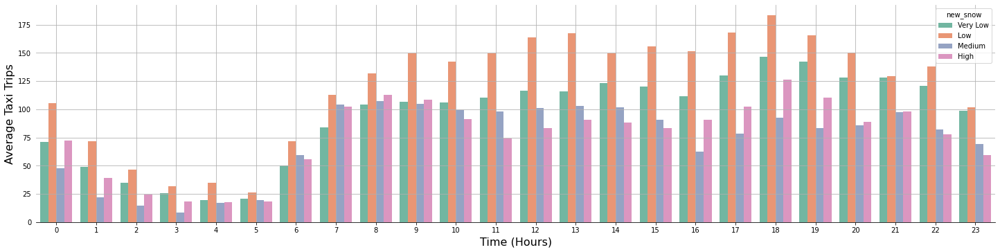

In [44]:
plot_barplot(
    hourly_pickup_count_nsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="new_snow",
    xlabel="Time (Hours)",
    ylabel="Average Taxi Trips",
)

There are lots of confounding variables, including seasonal trends, annual growth due to boro taxis, and whether weather events happen to fall on weekdays or weekends, but it would appear that snowfall has a significant negative impact on daily taxi ridership:

In [54]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_avg_nsnow= (
    train_df.groupby(["pickup_hour", "new_snow"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg_nsnow["trip_speed"] = np.divide(
    hourly_pickup_avg_nsnow["trip_distance"], np.divide(hourly_pickup_avg_nsnow["trip_duration"], 60)
)

# Map numerical values to average temperature groups
hourly_pickup_avg_nsnow["new_snow"] = hourly_pickup_avg_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_avg_nsnow.head()

,pickup_hour,new_snow,trip_distance,trip_duration,trip_speed
0,0,Very Low,5.115564,12.503839,24.547168
1,0,Low,4.534678,10.795893,25.202239
2,0,Medium,6.994361,14.668596,28.609531
3,0,High,5.383853,11.258276,28.692774
4,1,Very Low,4.871551,11.447224,25.533970


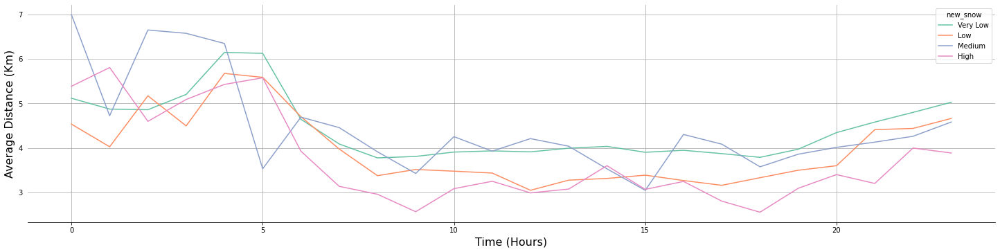

In [46]:
# Display a
plot_lineplot(
    hourly_pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="new_snow",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)"
)

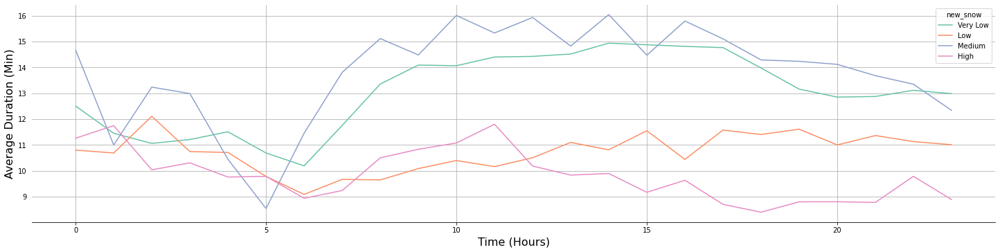

In [56]:
# Display a
plot_lineplot(
    hourly_pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="new_snow",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)"
)

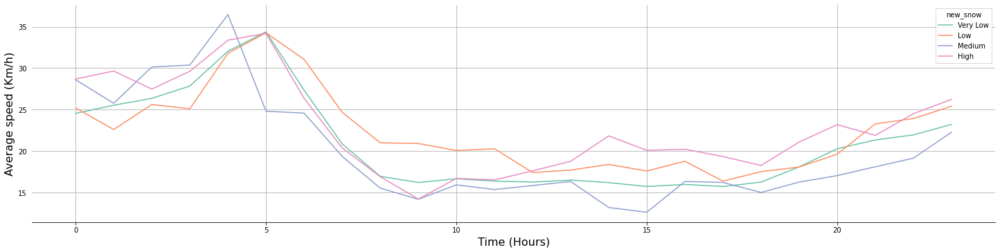

In [55]:
# Display a
plot_lineplot(
    hourly_pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="new_snow",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)"
)

In [ ]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_count_dsnow = (
    train_df.groupby(["pickup_hour", "snow_depth", "pickup_yearday"])
    .size()
    .to_frame("count")
    .reset_index()
)


# Replace zeros with NaN to avoid impacting the mean
hourly_pickup_count_nsnow["count"].replace(0, np.nan, inplace=True)

#
hourly_pickup_count_nsnow = (
    hourly_pickup_count_nsnow.groupby(["pickup_hour", "snow_depth"])
    .agg({"count": np.mean})
    .reset_index()
)


# Map numerical values to average temperature groups
hourly_pickup_count_nsnow["snow_depth"] = hourly_pickup_count_nsnow["snow_depth"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_count_nsnow.head()

ValueError: Could not interpret input 'count'

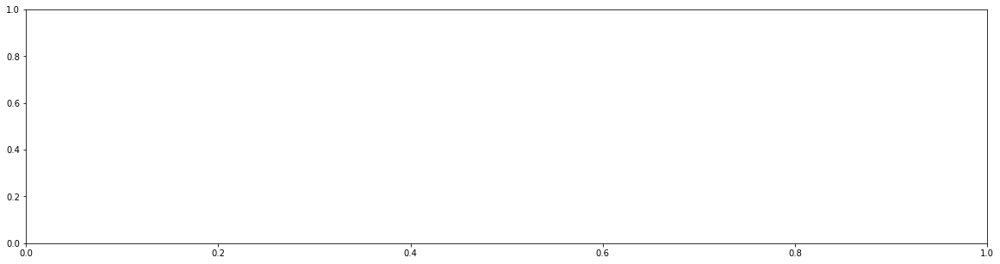

In [61]:
plot_barplot(
    hourly_pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="snow_depth",
    xlabel="Time (Hours)",
    ylabel="Average Taxi Trips",
)

In [60]:
# Group taxi rides by hours and average temeprature
# Compute the mean of trip distrances and durations
hourly_pickup_avg_dsnow= (
    train_df.groupby(["pickup_hour", "snow_depth"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg_dsnow["trip_speed"] = np.divide(
    hourly_pickup_avg_dsnow["trip_distance"], np.divide(hourly_pickup_avg_dsnow["trip_duration"], 60)
)

# Map numerical values to average temperature groups
hourly_pickup_avg_dsnow["snow_depth"] = hourly_pickup_avg_dsnow["snow_depth"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Display the first five rows of the data frame
hourly_pickup_avg_dsnow.head()

,pickup_hour,snow_depth,trip_distance,trip_duration,trip_speed
0,0,Very Low,5.100321,12.499660,24.482204
1,0,Low,5.578529,12.343435,27.116578
2,0,Medium,6.600018,12.858759,30.796215
3,0,High,5.003596,11.572268,25.942692
4,1,Very Low,4.862754,11.444626,25.493647


***
## Data Export